# Task 4 : Image Reconstruction using Matrix Factorisation [4 Marks]

doubts:
- should I normalize? (0-1)
- sigmoid, minmaxscaling, increase contrast
- inverse transform?
- what sigma to chose?

not all features of sine wave used

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import pandas as pd

import torch
import torchvision
from torchmetrics.functional.image import peak_signal_noise_ratio
from torchmetrics.functional.regression import mean_squared_error
from torch import nn
from sklearn.kernel_approximation import RBFSampler

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from latexify import latexify, format_axes

device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

from einops import rearrange


## Question 1
Pick an image of your liking and reconstruct it using matrix factorization. Choose a suitable value for the rank $r$. Run Gradient Descent until it converges, plot the reconstructed image alongside the original image. Calculate and report the RMSE and PSNR metrics. [1 Marks]

In [4]:
def mask_image(img,
               prop=None,
               patch_size=None,
               device=device):
    img_copy = img.clone().to(device)
    if patch_size is not None:
        mask = torch.zeros(img.shape).to(device=device, dtype=torch.bool)
        height, width = img.shape[1:]
        # Generate random coordinates for the top-left corner of the patch
        x_start = torch.randint(0, width - patch_size, (1,)).to(device)
        y_start = torch.randint(0, height - patch_size, (1,)).to(device)
        # Set the patch to False
        mask[:, y_start:y_start + patch_size, x_start:x_start + patch_size] = True
    else:
        mask = torch.rand(img.shape[1:]) < prop # uniform distribution
    img_copy[0][mask] = float('nan')
    img_copy[1][mask] = float('nan')
    img_copy[2][mask] = float('nan')
    return img_copy, mask

In [5]:
def factorize(A, k, device=device):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = torch.optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward()
        
        # Update the parameters
        optimizer.step()
        
    return W, H, loss

In [6]:
# Calculate and report the RMSE and PSNR metrics.
def metrics(img, reconstructed_img):
    rmse = mean_squared_error(target = img.reshape(-1),
                             preds=reconstructed_img.reshape(-1),
                             squared=False)
    psnr = peak_signal_noise_ratio(target=img.reshape(-1),
                                   preds=reconstructed_img.reshape(-1))
    return rmse, psnr

In [7]:
latexify()

def plot_image_completion(img,
                          prop=None,
                          factors=500,
                          patch_size=None,
                          device=device):
    if patch_size is not None:
        masked_img, mask = mask_image(img=img,
                                      patch_size=patch_size,
                                      device=device)
    else: 
        masked_img, mask = mask_image(img=img, 
                                      prop=prop,
                                      device=device)
    
    Wr, Hr, lossr = factorize(masked_img[0], factors, device=device)
    Wg, Hg, lossg = factorize(masked_img[1], factors, device=device)
    Wb, Hb, lossb = factorize(masked_img[2], factors, device=device)
    
    reconstructed_img = torch.stack([torch.mm(Wr, Hr).detach(), torch.mm(Wg, Hg).detach(), torch.mm(Wb, Hb).detach()], dim=0)
    # min max scale reconstructed_img tensor
    # reconstructed_img = (reconstructed_img - reconstructed_img.min()) / (reconstructed_img.max() - reconstructed_img.min())
    reconstructed_img = torch.clamp(reconstructed_img, 0, 1)
    # print metrics

    rmse, psnr = metrics(img, reconstructed_img)
    print(f"RMSE: {rmse:.4f}")
    print(f"PSNR: {psnr:.4f}")
    
    # Plot the original, masked, and reconstructed images
    fig, ax = plt.subplots(1, 3, figsize=(20, 10))

    ax[0].imshow(img.permute(1,2,0).cpu().numpy())
    ax[0].set_title(r"Original image", fontsize=14)
    ax[1].imshow(masked_img.permute(1,2,0).cpu().numpy())
    ax[1].set_title(r"Masked image", fontsize=14)
    ax[2].imshow(reconstructed_img.permute(1,2,0).cpu().numpy())
    ax[2].set_title(r"Reconstructed image", fontsize=14)

    # Make the layout tight for better appearance
    plt.tight_layout()
    plt.show()

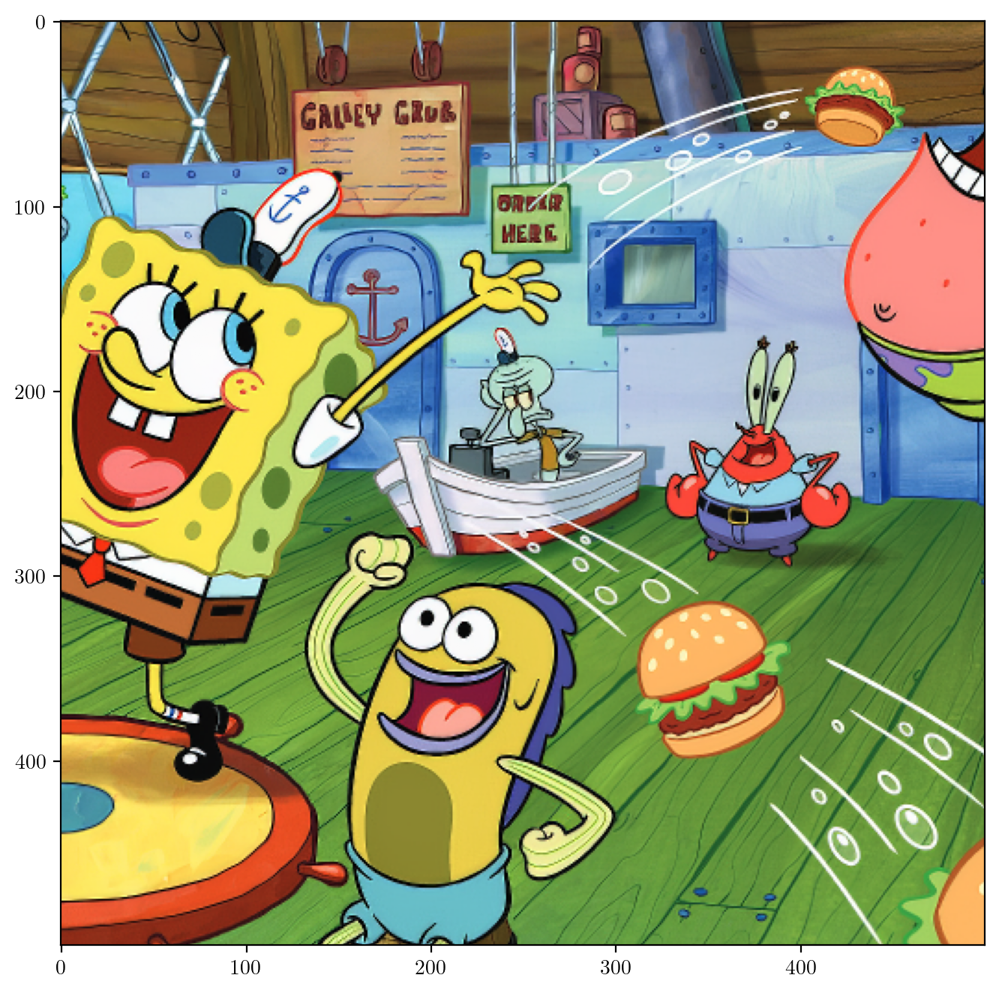

In [8]:
krustykrab = torchvision.io.read_image("images/krustykrab.png")
krustykrab = krustykrab.to(dtype=torch.float32, device=device)/255

transform = torchvision.transforms.Compose([
    torchvision.transforms.CenterCrop((500, 500))

    # torchvision.transforms.Grayscale(num_output_channels=1)  # Apply grayscale after resizing
    # normalize
    # torchvision.transforms.Normalize(mean=0.5, std=0.5)

])

krustykrab = transform(krustykrab)

plt.figure(figsize=(12, 8))  
plt.imshow(krustykrab.permute(1,2,0).cpu().numpy())
plt.show()

RMSE: 0.2271
PSNR: 12.8775


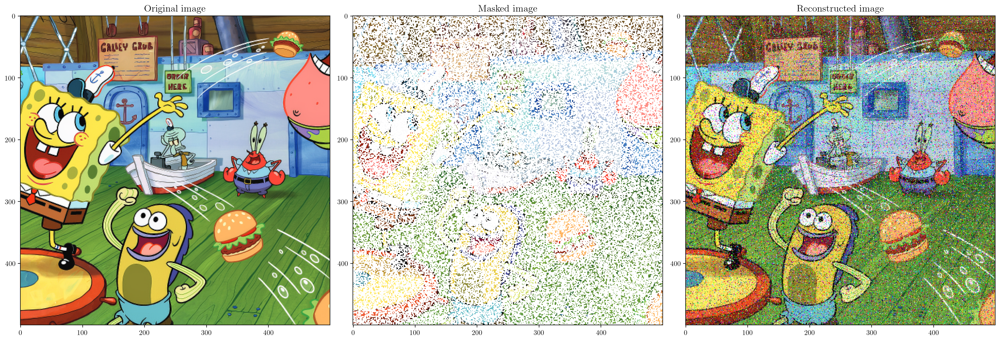

In [9]:
plot_image_completion(krustykrab, prop=0.3, factors=300, device=device)

In [200]:
# function that randomly removes 900 pixels from the image
def random_mask_image(img, device=device):
    img_copy = img.clone().to(device)
    mask = torch.zeros(img.shape).to(device=device, dtype=torch.bool)
    height, width = img.shape[1:]
    # Generate random coordinates for the top-left corner of the patch
    x_start = torch.randint(0, width - 30, (1,)).to(device)
    y_start = torch.randint(0, height - 30, (1,)).to(device)
    # Set the patch to False
    mask[:, y_start:y_start + 30, x_start:x_start + 30] = True
    img_copy[0][mask] = float('nan')
    img_copy[1][mask] = float('nan')
    img_copy[2][mask] = float('nan')
    return img_copy, mask

## Question 2
Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.\
[3 Marks]

In [50]:
def create_linear_model(input_dim, output_dim):
  # nn is the neural network module
  return nn.Linear(input_dim, output_dim).to(device)
 
# create RFF features
def create_rff_features(tensor, num_features, sigma):
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state=42)
    tensor = torch.tensor(rff.fit_transform(tensor.cpu().numpy())).float().to(device)
    return tensor

def extract_coordinates_pixels(image): # this function extracts the coordinates and pixel values of an image tensor and returns them
  channels, height, width = image.shape
  coords = [] # store the coordinates
  pixel_values = [] # store the pixel values

  for y in range(height):
    for x in range(width):
      if image[0][x][y].isnan():
        continue
      coords.append([x, y])
      pixel_values.append(image[:, x, y].tolist())

  
  coords = torch.tensor(coords, dtype=torch.float32)
  pixel_values = torch.tensor(pixel_values, dtype=torch.float32)

  print("Coordinates shape: ", coords.shape)
  print("Pixel values shape: ", pixel_values.shape)
  return coords.to(device), pixel_values.to(device)

def train(coords, pixels, model, learning_rate=0.01, epochs=1000, threshold=1e-6, verbose=True):
    """
    Train the model with early stopping based on loss change.

    coords: torch.Tensor of shape (num_samples, 2) - the coordinate map.
    pixels: torch.Tensor of shape (num_samples, num_channels) - the pixel values.
    model: torch.nn.Module - the model to train.
    learning_rate: float - the learning rate for the optimizer.
    epochs: int - the maximum number of epochs for training.
    verbose: bool - whether to print progress messages.
    threshold: float - the threshold for early stopping based on the change in loss.

    Returns: the final loss value (float).
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    previous_loss = float('inf')

    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = model(coords)
        loss = criterion(outputs, pixels)
        loss.backward()
        optimizer.step()

        # check for early stopping
        if abs(previous_loss - loss.item()) < threshold:
            print(f"Stopping early at epoch {epoch} with loss: {loss.item():.6f}")
            break

        previous_loss = loss.item()

        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")

    return loss.item()

In [124]:
rff_masked = mask_image(img = krustykrab, prop=0.0036, device=device)[0] # image with ~900 pixels removed
# rff_masked = torchvision.transforms.CenterCrop((100, 100))(rff_masked)
rff_masked.shape

torch.Size([3, 500, 500])

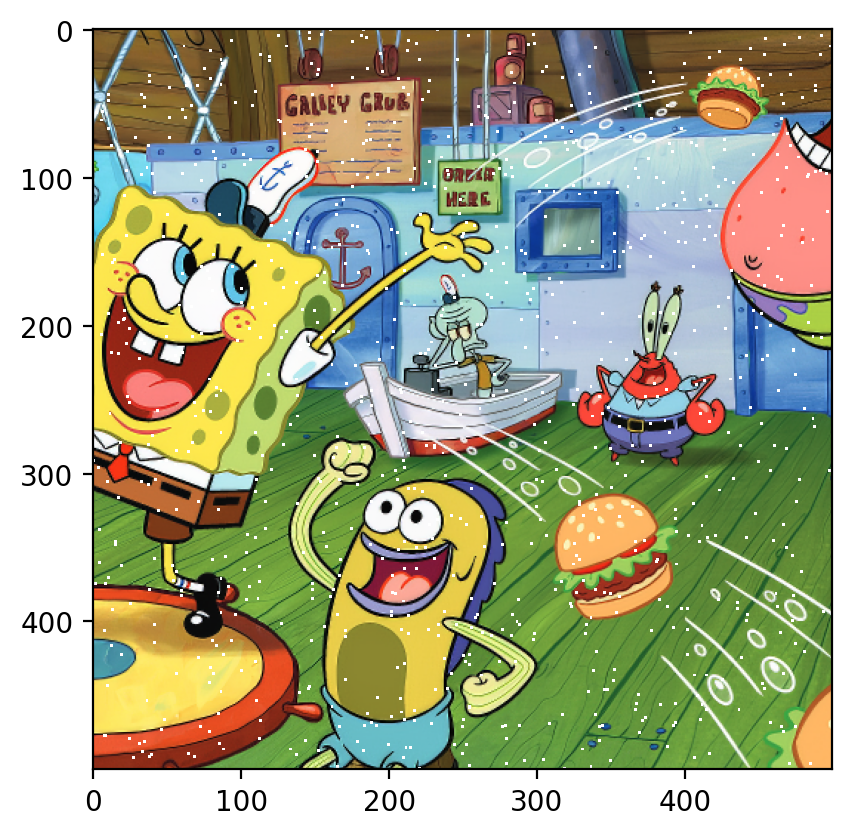

In [125]:
plt.imshow(rff_masked.permute(1,2,0).cpu().numpy())

In [128]:
# we need these coordinates when testing
coords_org = []
for x in range(500):
    for y in range(500):
      coords_org.append([x, y])
coords_org = torch.tensor(coords_org, dtype=torch.float32, device=device)

# model: 10000 features -> 3 color channels : happens for each pixel

# training: image_rff (<250000, 10000)
# testing: test_rff (250000, 10000)
# test_rff = create_rff_features(coords_org, 10000, 0.008)

In [129]:
coords, pixel_values = extract_coordinates_pixels(rff_masked) # corresponding pixel values for the masked image
pixel_values.shape
# nans removed

Coordinates shape:  torch.Size([249071, 2])
Pixel values shape:  torch.Size([249071, 3])


torch.Size([249071, 3])

In [1]:
sigma = 2

In [2]:
image_rff = create_rff_features(coords, 10000, sigma)
# get rff features for <250000 pixels

NameError: name 'create_rff_features' is not defined

In [167]:
image_rff.shape

torch.Size([249071, 10000])

In [168]:
model = create_linear_model(image_rff.shape[1], 3)
model.to(device)

train(image_rff, pixel_values, model, learning_rate=0.01,
      epochs=10000, threshold=1e-9, verbose=True) # feeding < 250000 image_rff and correspondoing pixel values

Epoch 0 loss: 0.342788
Epoch 100 loss: 0.046686
Epoch 200 loss: 0.041632
Epoch 300 loss: 0.039230
Epoch 400 loss: 0.037748
Epoch 500 loss: 0.036755
Epoch 600 loss: 0.036062
Epoch 700 loss: 0.035559
Epoch 800 loss: 0.035177
Epoch 900 loss: 0.034875
Epoch 1000 loss: 0.034626
Epoch 1100 loss: 0.034416
Epoch 1200 loss: 0.034235
Epoch 1300 loss: 0.034079
Epoch 1400 loss: 0.033942
Epoch 1500 loss: 0.033823
Epoch 1600 loss: 0.033719
Epoch 1700 loss: 0.033628
Epoch 1800 loss: 0.033548
Epoch 1900 loss: 0.033477
Epoch 2000 loss: 0.033413
Epoch 2100 loss: 0.033357
Epoch 2200 loss: 0.033307
Epoch 2300 loss: 0.033261
Epoch 2400 loss: 0.033220
Epoch 2500 loss: 0.033183
Epoch 2600 loss: 0.033149
Epoch 2700 loss: 0.033119
Epoch 2800 loss: 0.033091
Epoch 2900 loss: 0.033066
Epoch 3000 loss: 0.033044
Epoch 3100 loss: 0.033024
Epoch 3200 loss: 0.033006
Epoch 3300 loss: 0.032990
Epoch 3400 loss: 0.032976
Epoch 3500 loss: 0.032964
Epoch 3600 loss: 0.032954
Epoch 3700 loss: 0.032945
Epoch 3800 loss: 0.03293

0.03290525823831558

In [169]:
model(image_rff).shape

torch.Size([249071, 3])

In [170]:
test_rff = create_rff_features(coords_org, 10000, sigma)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34320554..1.2484487].


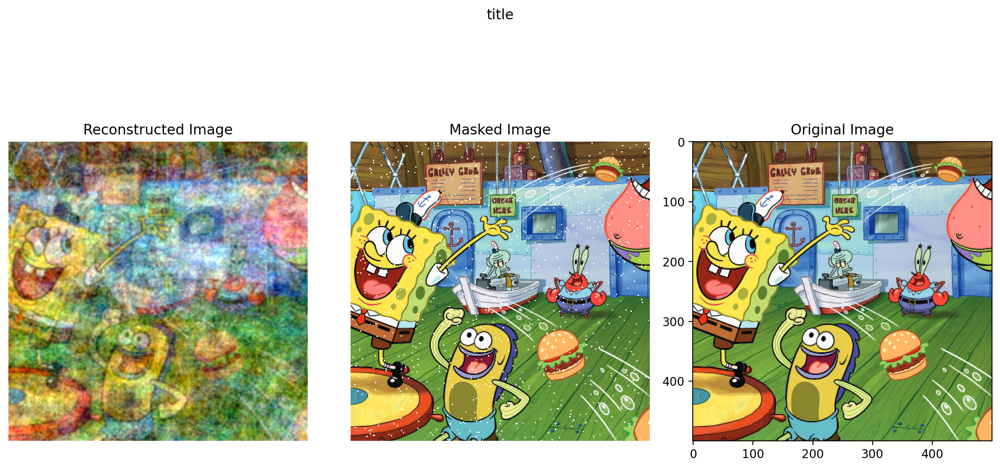

In [171]:
model.eval()
with torch.no_grad():
    outputs = model(test_rff).reshape(500, 500, 3)

fig = plt.figure(figsize=(12, 8))
# this allows us to create a flexible grid layout for plotting multiple subplots
gs = GridSpec(1, 3, width_ratios=[1, 1, 1])
ax0 = plt.subplot(gs[0])
ax1 = plt.subplot(gs[1])
ax2 = plt.subplot(gs[2])
ax0.imshow(outputs.detach().cpu().numpy())
ax0.set_title("Reconstructed Image")
ax1.imshow(rff_masked.permute(1,2,0).detach().cpu().numpy())
ax1.set_title("Masked Image")
ax2.imshow(krustykrab.permute(1, 2, 0).cpu())
ax2.set_title("Original Image")
for a in [ax0, ax1]:
    a.axis("off")
fig.suptitle("title", y=0.9)
plt.tight_layout()

In [172]:
peak_signal_noise_ratio(krustykrab, outputs.permute(2, 0, 1))

tensor(18.8630, device='mps:0')